In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

### Generating Random Training Data

In [2]:
# Create the initial set of random inputs
import random

number_training_inputs = 100000
tuple_length = 3
training_inputs = []
int_max = 2_147_483_648 * 2

classify_triangle_data_bounds = [1, int_max]

def produce_random_int_tuples(tuple_length, number_random_tuples, value_bounds):
    random_tuples = []
    for i in range(number_random_tuples):
        random_tuple = []
        for j in range(tuple_length):
           random_value = random.randint(value_bounds[0], value_bounds[1])
           random_tuple.append(random_value)
        random_tuples.append(tuple(random_tuple))
    return random_tuples
    
training_inputs = produce_random_int_tuples(tuple_length=tuple_length, number_random_tuples=number_training_inputs, value_bounds=classify_triangle_data_bounds)
print(training_inputs)

[(2468677164, 2805934308, 4237254914), (3355291905, 2152777743, 2320933623), (3617979135, 486750610, 69960825), (804538692, 186439137, 1646272055), (3449680891, 1872709441, 3098086433), (1589788354, 1096902479, 3914785114), (269371578, 563476538, 2479394440), (2676007181, 2656278688, 2533581096), (2260316692, 2039710609, 1606456908), (2726854342, 2783930141, 859469324), (1894531961, 3008856326, 522203652), (3352702462, 1002228508, 697676784), (2773722630, 2480228987, 170244188), (427012862, 3549290643, 1970619619), (2166575268, 3050017200, 3240791513), (1311272718, 2125632022, 1824774794), (1773007077, 2839878246, 122084615), (1597158531, 1892722415, 2605511662), (2301628248, 2586814395, 3544463690), (1745508902, 1466929912, 1987501258), (2942867191, 3773141241, 4241035452), (4269258603, 1281835627, 2997438788), (3841133037, 3509328158, 305024483), (2088980169, 2775481592, 2921004145), (555535129, 3200424321, 3341179338), (3770628455, 1843491963, 1182639944), (1199890553, 3223459867, 3

##### Triangle Classification and Execution Code

In [3]:
def classify_triangle(a, b, c):
    triangle = 0
    if a == b:
        triangle += 1
    if a == c:
        triangle += 2
    if b == c:
        triangle += 3
    
    if triangle == 0:
        if a + b <= c or a + c < b or b + c < a:
            raise Exception("Not a Triangle")
        return "Scalene"
    
    if triangle > 3:
        return "Equilateral"
    
    if triangle == 1 and a + b > c:
        return "Isosceles"
    elif triangle == 2 and a + c > b:
        return "Isosceles"
    elif triangle == 3 and b + c > a:
        return "Isosceles"
    
    raise Exception("Not a Triangle")

# Execute the classify_triangle function with the random triple inputs generated
def execute_classify_triangle(random_inputs):
    inputs_that_return = []
    inputs_that_throw_exceptions = []

    for triple in random_inputs:
        result = None
        a = triple[0]
        b = triple[1]
        c = triple[2]
        try:
            result = classify_triangle(a, b, c)
        except:
            result = None
    
        if result is not None:
            inputs_that_return.append(triple)
        else:
            inputs_that_throw_exceptions.append(triple)

    return inputs_that_return, inputs_that_throw_exceptions

In [4]:
# Partition the training data
training_labels = execute_classify_triangle(random_inputs=training_inputs)
training_inputs_that_return = training_labels[0]
training_inputs_that_throw_exceptions = training_labels[1]
print(len(training_inputs_that_return))
print(len(training_inputs_that_throw_exceptions))

50176
49824


In [5]:
K = 3

In [6]:
# Cluster the good inputs
return_inputs_clusters = KMeans(n_clusters=K)
return_inputs_clusters.fit(training_inputs_that_return)
centroids_of_return_clusters = return_inputs_clusters.cluster_centers_
print(centroids_of_return_clusters)
print(len(return_inputs_clusters.labels_))

[[1.74885761e+09 3.24926177e+09 3.25765835e+09]
 [1.73826789e+09 1.59704984e+09 1.61133623e+09]
 [3.46375855e+09 2.67208712e+09 2.65656421e+09]]
50176


In [7]:
# Cluster the bad inputs
exception_inputs_clusters = KMeans(n_clusters=K)
exception_inputs_clusters.fit(training_inputs_that_throw_exceptions)
centroids_of_exception_clusters = exception_inputs_clusters.cluster_centers_
print(centroids_of_exception_clusters)
print(len(exception_inputs_clusters.labels_))

[[3.22684881e+09 1.09039708e+09 1.06728566e+09]
 [1.06134667e+09 3.21851609e+09 1.07457847e+09]
 [1.07296890e+09 1.07463370e+09 3.21782988e+09]]
49824


### Plotting the Training Inputs that result in Returns

Text(0.5, 0, 'c')

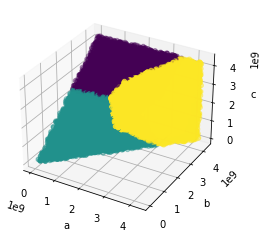

In [8]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

x_values_return = [x for x, y, z in training_inputs_that_return]
y_values_return = [y for x, y, z in training_inputs_that_return]
z_values_return = [z for x, y, z in training_inputs_that_return]
ax.scatter(x_values_return, y_values_return, z_values_return, c=return_inputs_clusters.labels_)

x_values_exception = [x for x, y, z in training_inputs_that_throw_exceptions]
y_values_exception = [y for x, y, z in training_inputs_that_throw_exceptions]
z_values_exception = [z for x, y, z in training_inputs_that_throw_exceptions]
# ax.scatter(x_values_div, y_values_div, z_values_div)

ax.set_xlabel('a')
ax.set_ylabel('b')
ax.set_zlabel('c')

In [9]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

# Configure the trace.
return_trace = go.Scatter3d(
    x=x_values_return, 
    y=y_values_return,
    z=z_values_return,
    mode='markers',
    marker={
        'size': 5,
        'opacity': 0.8,
        'color' : return_inputs_clusters.labels_
    }
)

# Configure the trace.
exception_trace = go.Scatter3d(
    x=x_values_exception, 
    y=y_values_exception,
    z=z_values_exception,
    mode='markers',
    marker={
        'size': 5,
        'opacity': 0.8,
        'color' : 'red'
    },
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data_return = [return_trace]

plot_figure = go.Figure(data=data_return, layout=layout)
# plot_figure.add_trace(exception_trace)

plotly.offline.iplot(plot_figure)

### Test the Return / Exception Classification on new Test Data

In [10]:
# Generate new random triples
test_inputs = produce_random_int_tuples(tuple_length=tuple_length, number_random_tuples=number_training_inputs, value_bounds=classify_triangle_data_bounds)

print(len(test_inputs))
# Ensure there are no common elements between the training and test data
test_inputs = list(set(test_inputs) - set(training_inputs))
print(len(test_inputs))

# Obtain the ground truth test data
ground_truths = execute_classify_triangle(test_inputs)
ground_truth_returns = ground_truths[0]
ground_truth_exceptions = ground_truths[1]
print(len(ground_truth_returns))

100000
100000
49893


In [11]:
# For each test input, infer which cluster it belongs to in both the set of 'return' and 'exception' clusters
preds_from_return_clusters = return_inputs_clusters.predict(test_inputs)
preds_from_exception_clusters = exception_inputs_clusters.predict(test_inputs)

In [12]:
from scipy.spatial import distance

test_inputs_inferred_as_returning = []
test_inputs_inferred_as_throwing_exceptions = []

for m in range(len(test_inputs)):
    test_input = test_inputs[m]

    # Get the respective predictions
    return_cluster_prediction = preds_from_return_clusters[m]
    exception_cluster_prediction = preds_from_exception_clusters[m]

    # Get the centroid of the cluster that each prediction belongs to
    return_cluster_centroid = centroids_of_return_clusters[return_cluster_prediction]
    exception_cluster_centroid = centroids_of_exception_clusters[exception_cluster_prediction]

    # Get the distance of the test_input from the predicted return and exception cluster
    distance_to_return_cluster_centroid = distance.euclidean(return_cluster_centroid, test_input)
    distance_to_exception_cluster_centroid = distance.euclidean(exception_cluster_centroid, test_input)
    
    # Choose the min and add to return or exception - inducing list
    if distance_to_return_cluster_centroid < distance_to_exception_cluster_centroid:
        test_inputs_inferred_as_returning.append(test_input)
    else:
        test_inputs_inferred_as_throwing_exceptions.append(test_input)
    
print(test_inputs_inferred_as_returning)
print(test_inputs_inferred_as_throwing_exceptions)

[(859581072, 2161273524, 1810029024), (1318489945, 296244909, 1024194618), (1764908699, 2445615086, 4016843479), (4071677243, 2288569196, 3143482490), (2889707811, 2954381506, 1486507249), (3899143762, 2976727339, 2841024989), (509987319, 941087374, 1609643879), (1795485299, 776675778, 1472114713), (1771396667, 1924649386, 980008181), (3077421885, 1136610918, 4224574318), (3976699468, 2253376489, 2508810144), (4193545717, 2089304221, 2020847640), (734028993, 4115732632, 2401391452), (1821958541, 2527700899, 4066052695), (3219662882, 3480328816, 655960363), (1760734409, 4223710937, 3519734237), (201365297, 1040758987, 415476866), (1982837537, 903156663, 872110347), (2832277381, 4094704392, 2807556570), (2373253802, 4220707087, 3728030556), (1740392155, 741935748, 1797561383), (2823255725, 2684742224, 3768164678), (455910753, 209044522, 1576190802), (2535052892, 3421630371, 1978859269), (149544831, 215402251, 1073523951), (3003858317, 1335292082, 4027551727), (2179164891, 294120928, 2263

In [13]:
print(len(test_inputs_inferred_as_returning))
print(len(test_inputs_inferred_as_throwing_exceptions))

51914
48086


### Accuracy Assessment for the Return / Exception Predictions

In [14]:
test_inputs_inferred_as_returning = set(test_inputs_inferred_as_returning)
ground_truth_returns = set(ground_truth_returns)

intersection_return_inferences_and_return_ground_truths = test_inputs_inferred_as_returning.intersection(ground_truth_returns)
accuracy_return_inference = (len(intersection_return_inferences_and_return_ground_truths) / len(test_inputs_inferred_as_returning)) * 100
print(accuracy_return_inference)

82.86589359325038


In [15]:
test_inputs_inferred_as_throwing_exceptions = set(test_inputs_inferred_as_throwing_exceptions)
ground_truth_exceptions = set(ground_truth_exceptions)

intersection_exception_inferences_and_exception_ground_truths = test_inputs_inferred_as_throwing_exceptions.intersection(ground_truth_exceptions)
accuracy_exception_inference = (len(intersection_exception_inferences_and_exception_ground_truths) / len(test_inputs_inferred_as_throwing_exceptions)) * 100
print(accuracy_exception_inference)

85.70477893773656
